# Example of maintenance for generator and plant
#### Example responsible: Jiehong Kong
#### Latest update: 08.01.2021

## Table of contents 
1. [Introduction](#Introduction)
2. [Numerical examples](#Examples)
    1. [Input data](#Input_data)
    2. [Run the optimization model](#Run_the_optimization_model)
    3. [Run the optimization model with the change of plant maintenance plan](#Loop)

## Introduction <a id="Introduction"></a>

Short-term hydro scheduling aims at determining the optimal generation schedules for the available hydro resources for the coming hours and days by utilizing the water potential in the most economical way. Maintenance, in general, is the activity to recover or keep a system in a functioning state. At present, the maintenance strategy is included in SHOP as pre-scheduled events. That is to say, the decision regarding which units in which stations at which time and for how long the units should be shut down for maintenance is given as time series input data. Whenever possible, the outages are planned at a time when they have the least impact on electricity production. This decision originates from the traditional corrective and preventive maintenance strategy.

In SHOP, maintenance can be given on the plant level <b>maintenance_flag</b> or on the generator level <b>maintenance_flag</b>. If the flag is set to 1, it indicates that the plant or the generator is under maintenance, and hence it is not available. If the flag is set to 0, the plant or the generator functions as normal.  

Maintenance has the highest priority. Once a hydropower plant or a gererator is under maintenance, it will not be included in the optimization model. Make sure that there are bypass or spill options so that water can bypass the plant under maintenance.

## Numerical examples <a id="Examples"></a>

### Input data <a id="Input_data"></a>

In order to check the impact of various maintenance plans on the objective value, we design a system that can freely choose the scheduling period for each test (run). Five basic data files are needed: 

1) <b> Test_model_multiplants.ascii: </b> We use a cascade hydro system that contains 9 reservoirs, 7 plants, and 18 gates.  <br>

2) <b> Data_market_price.csv: </b> The [market price](https://www.nordpoolgroup.com/historical-market-data/) comes from Nord Pool's day-ahead hourly prices of NO2 in 2017 (EUR/MWh). When changing from winter time to summer time (26/03/2017 02:00), duplicate the price of 26/03/2017 01:00. When changing from summer time to winter time (29/10/2017 02:00), delete the second price of repeated time 29/10/2017 02:00. <br>

3) <b> Data_inflow.csv: </b> Inflow to each reservoir is based on the historical daily data from NVE (Lislefjødd and Tannsvatn målestasjon). <br>

4) <b> Data_water_value_mwh.csv: </b> Water values at the end of scheduling horizon for different reservoirs are various, representing the future worth of stored water in the reservoirs. Water values in this file comes from the incremental cost <b>energy_value_local_result</b> at the right time step when we run the model for one year and set the final reservoir volume eqaul to the initial volume. <br>

5) <b> Data_initial_volume.csv: </b> Initial volume of each reservoir comes from the value <b>storage</b> at the right time step when we run the model for one year and set the final reservoir volume eqaul to the initial volume. <br>


In [1]:
# General introduction
import pandas as pd
import cufflinks as cf
from cufflinks import tools
import plotly.offline as py
import plotly.graph_objs as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np
from pyshop import ShopSession
import time
import math
cf.go_offline()
py.offline.init_notebook_mode(connected=True)

In [2]:
# Write out the current version of SHOP 
shop = ShopSession(license_path="", silent=False, log_file="log.file")
shop.shop_api.GetVersionString()

'14.0.0.4 Cplex 20.1.0 Gurobi 7.5 OSI/CBC 2.9 2021-05-26'

In [3]:
# Find the right data range (The only place needs to justify for each run. Pay attention to the time resolution for each attribute!)
scheduling_hours_for_each_run = 500
day_interval_between_each_run = 1
sequence_of_run = 1

# To avoid changing the code later, it is better to make sure all the data is given as "hourly" time resoltuion!
starttime_skip_index = (sequence_of_run - 1) * day_interval_between_each_run * 24
endtime_skip_index = (sequence_of_run - 1) * day_interval_between_each_run * 24 + scheduling_hours_for_each_run
market_price_skip_index = (sequence_of_run - 1) * day_interval_between_each_run * 24  # hourly market price
inflow_skip_index = (sequence_of_run - 1) * day_interval_between_each_run * 24 # hourly inflow
initial_volume_skip_index = (sequence_of_run - 1) * day_interval_between_each_run * 24  # hourly volume
end_water_value_index = (sequence_of_run - 1) * day_interval_between_each_run * 24 + scheduling_hours_for_each_run  # hourly water value


# Set scheduling period and time resolution
data = pd.read_csv('Data_market_price.csv', sep=',', header=0, index_col=["date"], usecols=["date"], skiprows=range(1, starttime_skip_index+1), nrows=1, squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
starttime = data.index[0]
starttime = pd.Timestamp(starttime)
print("starttime: ", starttime)

data = pd.read_csv('Data_market_price.csv', sep=',', header=0, index_col=["date"], usecols=["date"], skiprows=range(1, endtime_skip_index+1), nrows=1, squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
endtime = data.index[0]
endtime = pd.Timestamp(endtime)
print("endtime: ", endtime)

index = [pd.Timestamp(starttime.year, starttime.month, starttime.day, starttime.hour)]
resolution = [1]
time_resolultion = pd.Series(index=index, data=resolution)

starttime:  2017-01-01 00:00:00
endtime:  2017-01-21 20:00:00


In [4]:
# Build the model
def build_model(_shop):
    _shop.set_time_resolution(starttime=starttime, endtime=endtime, timeunit="hour", timeresolution=time_resolultion)
    
    # Read test model 
    _shop.read_ascii_file("Test_model_multiplants.ascii")
    
    # Read market price
    _shop.model.market.add_object("1")
    data = pd.read_csv('Data_market_price.csv', sep=',', header=0, index_col=["date"], usecols=["date", "sale_price (EUR/MWh)"], skiprows=range(1, market_price_skip_index+1), nrows=scheduling_hours_for_each_run, squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
    _shop.model.market["1"].sale_price.set(data)
    _shop.model.market["1"].max_sale.set(pd.Series([9999],[starttime]))
    
    data = pd.read_csv('Data_market_price.csv', sep=',', header=0, index_col=["date"], usecols=["date", "buy_price (EUR/MWh)"], skiprows=range(1, market_price_skip_index+1), nrows=scheduling_hours_for_each_run, squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
    _shop.model.market["1"].buy_price.set(data)
    _shop.model.market["1"].max_buy.set(pd.Series([9999],[starttime]))
    
    # Read inflow to reservoirs
    for rsv in _shop.model.reservoir:
        rsv_name = rsv.get_name()
        data = pd.read_csv('Data_inflow.csv', sep=',', header=0, index_col=["date"], usecols=["date", rsv_name], skiprows=range(1, inflow_skip_index+1), nrows=scheduling_hours_for_each_run, squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
        rsv.inflow.set(data)
        
    # Set initial volume of reservoirs 
    for rsv in _shop.model.reservoir:
        rsv_name = rsv.get_name()
        data = pd.read_csv('Data_initial_volume.csv', sep=',', header=0, index_col=["date"], usecols=["date", rsv_name], skiprows=range(1, initial_volume_skip_index+1), nrows=1, squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
        rsv.start_vol.set(data)
    
    # Set end water value of reservoirs 
    for rsv in _shop.model.reservoir:
        rsv_name = rsv.get_name()
        data = pd.read_csv('Data_water_value_mwh.csv', sep=',', header=0, index_col=["date"], usecols=["date", rsv_name], skiprows=range(1, end_water_value_index+1), nrows=1, squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
        rsv.energy_value_input.set(pd.Series([data.values[0]], index=[0]))
   
    
# Call the model
shop = ShopSession(license_path="", silent=False, log_file="log.file")
build_model(shop)

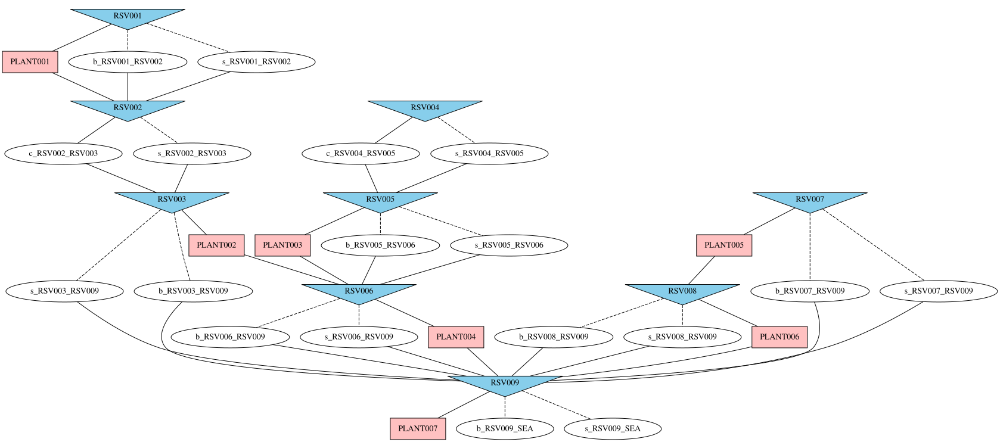

In [5]:
# Print out the topology
shop.model.build_connection_tree()

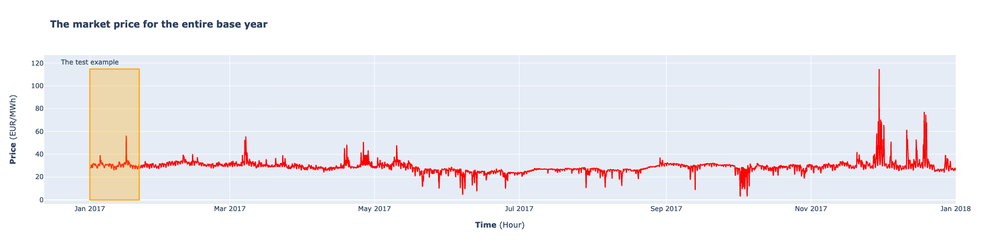

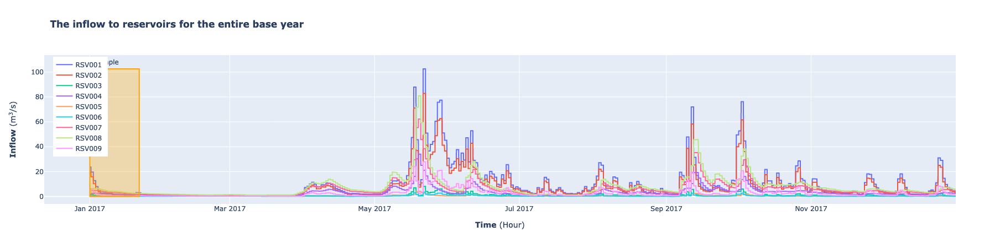

In [6]:
# Plot the position of the example on the whole data set
spot_price = pd.read_csv('Data_market_price.csv', sep=',', header=0, index_col=["date"], usecols=["date", "sale_price (EUR/MWh)"], squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)

fig = go.Figure()
fig.add_trace(go.Scatter(x=spot_price.index, y=spot_price.values, marker_color="red", showlegend=False))
fig.update_layout(title="<b>The market price for the entire base year </b>", xaxis_title="<b>Time</b> (Hour)", yaxis_title="<b>Price</b> (EUR/MWh)")
fig.add_shape(type="rect", name="The test example",  x0=starttime, y0=0, x1=endtime, y1=max(spot_price.values), line=dict(color="Orange"), fillcolor="rgba(255,165,0,0.3)")
fig.add_trace(go.Scatter(x=[starttime, endtime], y=[max(spot_price.values)*1.05, max(spot_price.values)*1.05], text=["The test example"], mode="text", showlegend=False))
# If using plotly 4.12, the above fig.add_shpae and fig.add_trace "text" can be replaced by fig.add_vrect
#fig.add_vrect(x0=starttime, x1=endtime, 
#              annotation_text="The test example", annotation_position="top left", 
#              fillcolor="orange", opacity=0.25, layer="below", line_width=0)
fig.show()


fig = go.Figure()
max_flow = 0
for rsv in shop.model.reservoir: 
    rsv_name = rsv.get_name()
    inflow_rsv = pd.read_csv('Data_inflow.csv', sep=',', header=0, index_col=["date"], usecols=["date", rsv_name], squeeze=True, parse_dates=True, infer_datetime_format=True, dayfirst=True)
    curve_name = rsv.get_name()
    fig.add_trace(go.Scatter(x=inflow_rsv.index, y=inflow_rsv.values, name=curve_name))
    rsv_max_flow = max(inflow_rsv.values)
    if (rsv_max_flow > max_flow):
        max_flow = rsv_max_flow
fig.update_layout(title="<b>The inflow to reservoirs for the entire base year </b>", xaxis_title="<b>Time</b> (Hour)", yaxis_title="<b>Inflow</b> (m<sup>3</sup>/s)")
fig.update_layout(legend=dict(yanchor="top", y=0.99, xanchor="left", x=0.01))
fig.add_shape(type="rect", name="The test example",  x0=starttime, y0=0, x1=endtime, y1=max_flow, line=dict(color="Orange"), fillcolor="rgba(255,165,0,0.3)")
fig.add_trace(go.Scatter(x=[starttime, endtime], y=[max_flow*1.05, max_flow*1.05], text=["The test example"], mode="text", showlegend=False))
# If using plotly 4.12, the above fig.add_shpae and fig.add_trace "text" can be replaced by fig.add_vrect
#fig.add_vrect(x0=starttime, x1=endtime, 
#              annotation_text="The test example", annotation_position="top left",
#              fillcolor="orange", opacity=0.25, layer="below", line_width=0)
fig.show()

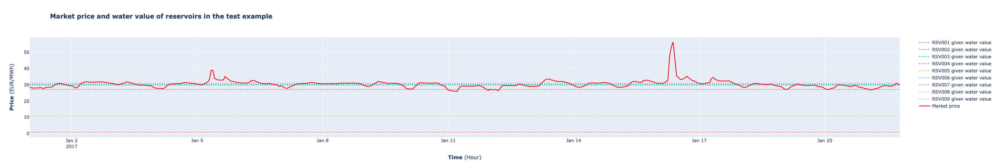

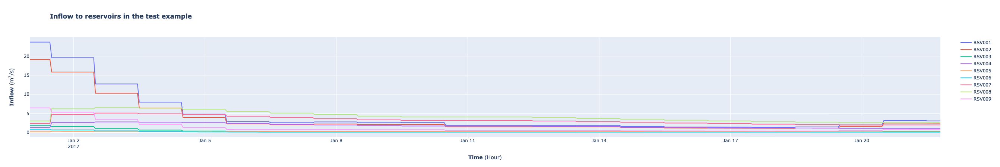

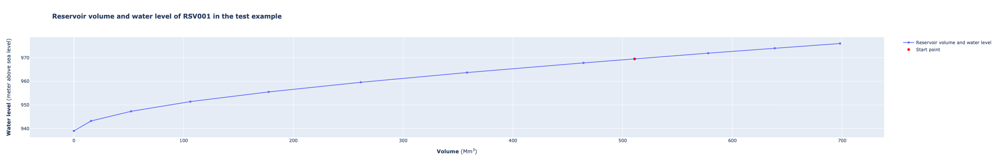

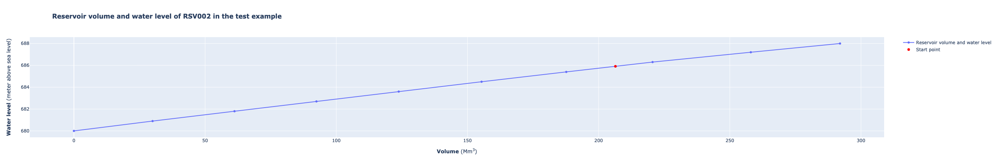

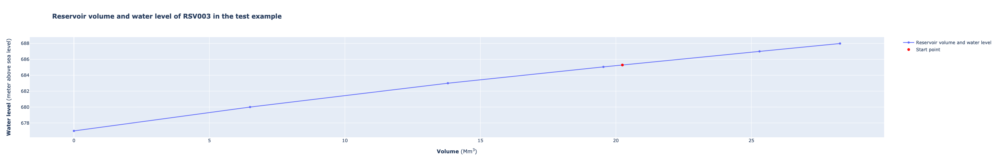

...

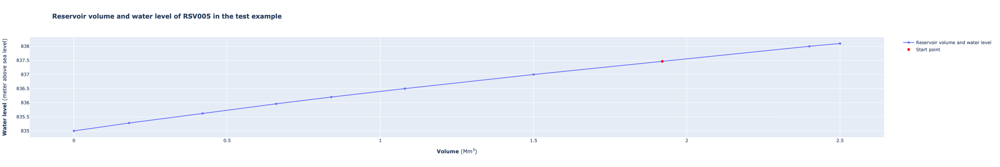

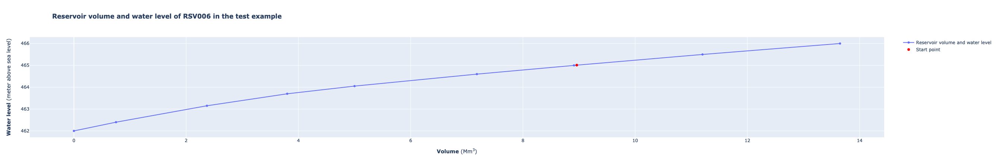

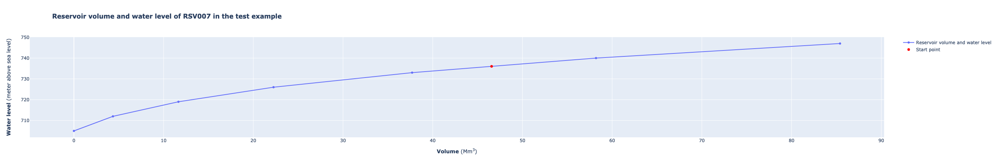

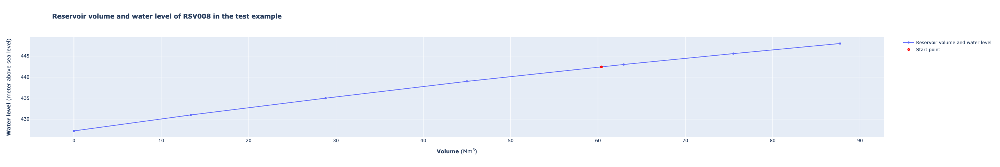

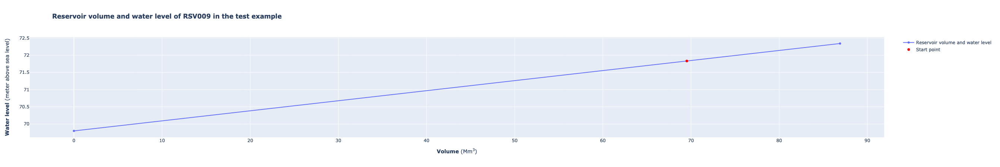

In [16]:
# Plot market price and water value of reservoirs
spot_price=shop.model.market["1"].sale_price.get()
fig = go.Figure()

for rsv in shop.model.reservoir:             
    # Method 1: if end_water_value is given, then we directly plot it
    end_water_value = rsv.energy_value_input.get()
    if (type(end_water_value) is not type (None)):
        water_value = pd.Series(dtype=object,index=spot_price.index)
        water_value = water_value.fillna(end_water_value) 
        curve_name = rsv.get_name()+" given water value"
    # Method 2: if end_water_value is not given, we plot the average price of market price
    else:
        end_water_value = np.average(spot_price.values)
        water_value = pd.Series(index=spot_price.index)
        water_value = water_value.fillna(end_water_value)      
        curve_name = rsv.get_name()+" average market price"
    fig.add_trace(go.Scatter(x=water_value.index, y=water_value.values, name=curve_name, line=dict(dash="dot")))

fig.add_trace(go.Scatter(x=spot_price.index, y=spot_price.values, name="Market price", marker_color="red"))
fig.update_layout(title="<b>Market price and water value of reservoirs in the test example </b>", xaxis_title="<b>Time</b> (Hour)", yaxis_title="<b>Price</b> (EUR/MWh)")
fig.show()

    
# Plot reservoir inflow
fig = go.Figure()
for rsv in shop.model.reservoir: 
    inflow_rsv = rsv.inflow.get()
    curve_name = rsv.get_name()
    fig.add_trace(go.Scatter(x=inflow_rsv.index, y=inflow_rsv.values, name=curve_name))
fig.update_layout(title="<b>Inflow to reservoirs in the test example </b>", xaxis_title="<b>Time</b> (Hour)", yaxis_title="<b>Inflow</b> (m<sup>3</sup>/s)")
fig.show()


# Plot reservoir volume in Mm3 and water level in meter above sea level of reservoirs
from scipy.interpolate import interp1d

for rsv in shop.model.reservoir: 
    vol_water_level=rsv.vol_head.get()
    start_volume=rsv.start_vol.get()
    start_water_level=rsv.start_head.get()
    
    if start_volume == 0 and start_water_level != 0: 
        interplation_function = interp1d(vol_water_level.values, vol_water_level.index)
        start_volume=float(interplation_function(start_water_level))
    
    if start_water_level == 0 and start_volume != 0:
        interplation_function = interp1d(vol_water_level.index, vol_water_level.values)
        start_water_level=float(interplation_function(start_volume))
        
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=vol_water_level.index, y=vol_water_level.values, name="Reservoir volume and water level", mode='lines+markers'))
    fig.add_trace(go.Scatter(x=[start_volume], y=[start_water_level], name='Start point', mode='markers', marker=dict(color='rgba(0,0,0, 0.0)', size=3, line=dict(color='Red', width=4))))
    title_name="<b> Reservoir volume and water level of "+rsv.get_name()+" in the test example </b>"
    fig.update_layout(title=title_name, xaxis_title="<b>Volume</b> (Mm<sup>3</sup>)", yaxis_title="<b>Water level</b> (meter above sea level)")
    fig.show()

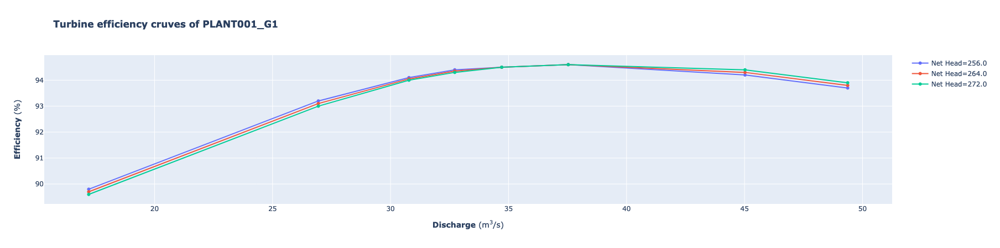

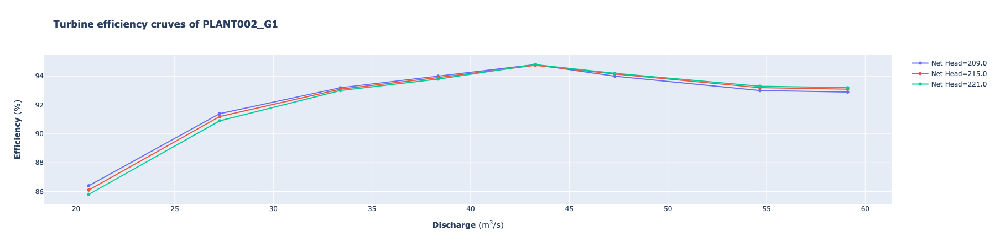

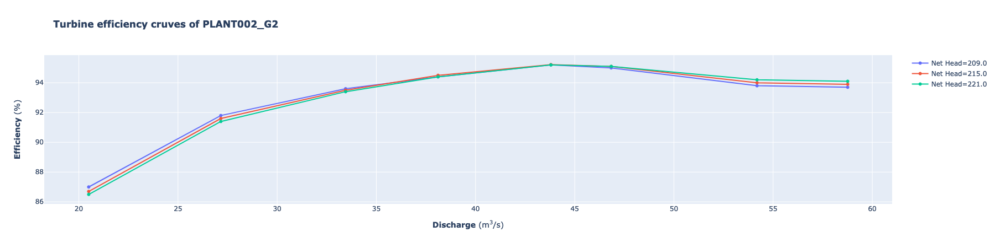

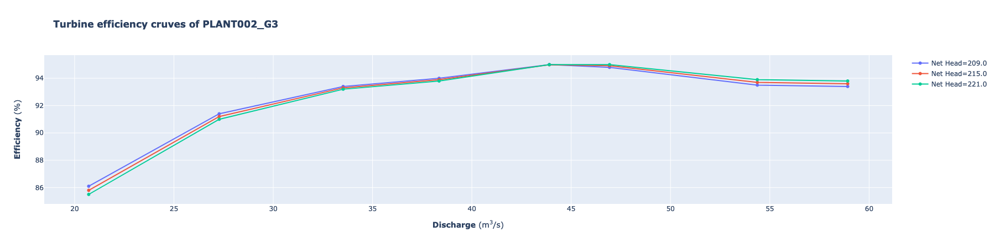

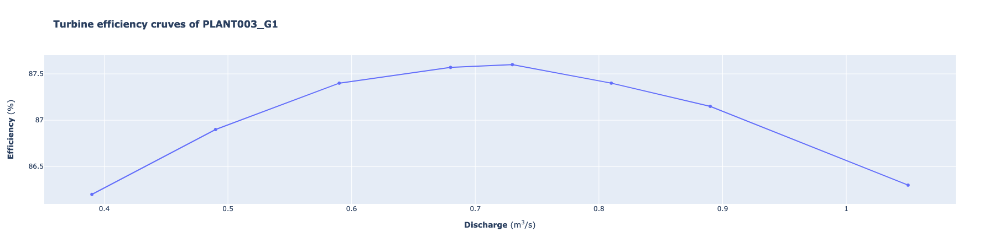

...

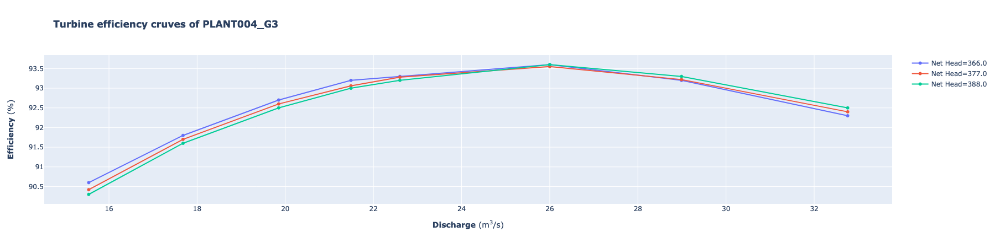

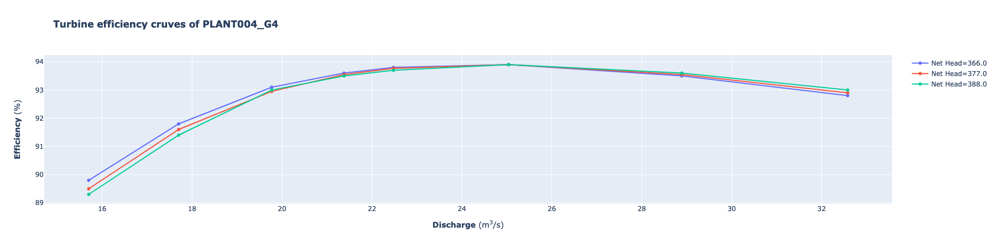

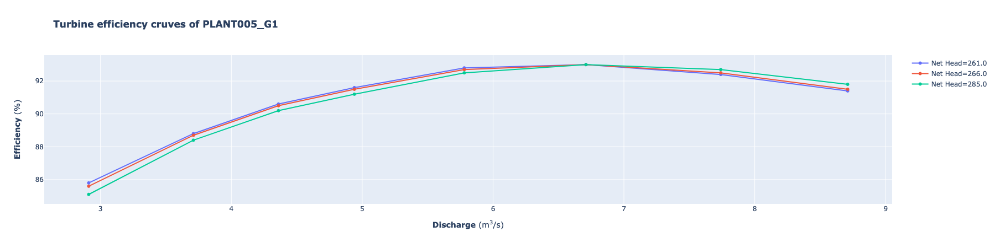

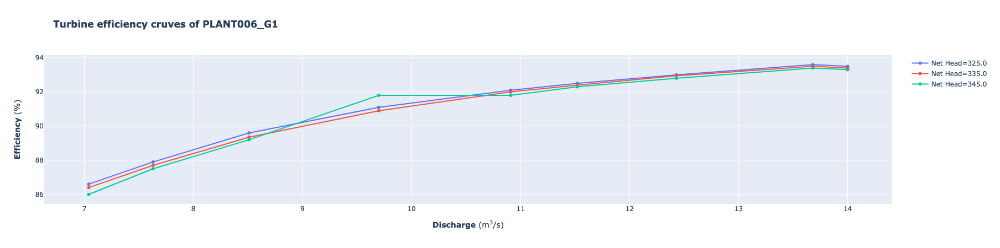

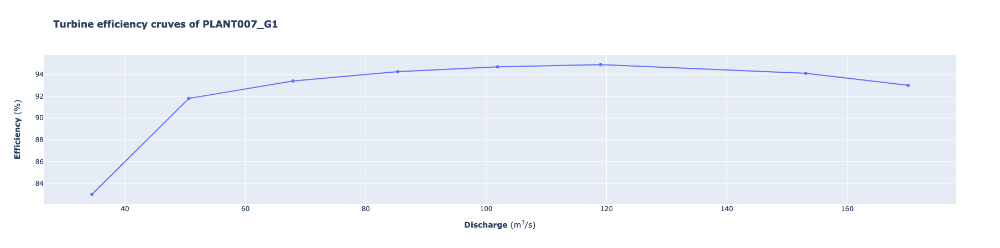

In [8]:
# Plot the turbine efficiency curves of generators in plants 
for gen in shop.model.generator:
    # normal turbine, gen_type = 0; Pelton, gen_type = 8
    gen_type=gen.type.get()
    if (gen_type == 0):
        turb_eff_curves=gen.turb_eff_curves.get()      
        fig = go.Figure()        
        for curve in turb_eff_curves:
            curve_name="Net Head="+str(curve.name)
            fig.add_trace(go.Scatter(x=curve.index, y=curve.values, name=curve_name, mode="lines+markers", line=dict(width=2)))
        
        title_name="<b> Turbine efficiency cruves of "+gen.get_name()+"</b>"
        fig.update_layout(title=title_name, xaxis_title="<b>Discharge</b> (m<sup>3</sup>/s)", yaxis_title="<b>Efficiency</b> (%)")       
        fig.show()

for needle_comb in shop.model.needle_combination:
    turb_eff_curves=needle_comb.turb_eff_curves.get()
    fig = go.Figure()        
    for curve in turb_eff_curves:
        curve_name="Net Head="+str(curve.name)
        fig.add_trace(go.Scatter(x=curve.index, y=curve.values, name=curve_name, mode="lines+markers", line=dict(width=2)))
    
    title_name="<b> Needle turbine efficiency cruves of "+needle_comb.get_name()+"</b>"
    fig.update_layout(title=title_name, xaxis_title="<b>Discharge</b> (m<sup>3</sup>/s)", yaxis_title="<b>Efficiency</b> (%)")       
    fig.show()

### Run the optimization model <a id="Run_the_optimization_model"></a>

In [9]:
# Choose whether include maintenance plan
without_maintenance = False
plant_maintenance = False
generator_maintenance = True

if (without_maintenance == True):
    title = "without maintenance"
elif (plant_maintenance == True):
    # Set plant maintenance plan (The first 72 hours = 1 (on maintanence) and the remaining hours = 0 (on operation))
    shop.model.plant["PLANT001"].maintenance_flag.set(pd.Series([1,0],[starttime, starttime+pd.Timedelta(hours=72)]))
    title = "when PLANT001 on maintenance"
elif (generator_maintenance == True):
    # Set generator maintenance plan (The first 72 hours = 1 (on maintanence) and the remaining hours = 0 (on operation))
    shop.model.generator["PLANT004_G1"].maintenance_flag.set(pd.Series([1,0],[starttime, starttime+pd.Timedelta(hours=72)]))
    title = "when PLANT004_G1 on maintenance"


# Set default run commands
def run_model(_shop):    
    # Command 1
    # Use command to activate mip_flag (default "off"). It is helpful to set mip_flag "off" if you run the model for a long period, but the result will not be precise.  
    _shop.set_universal_mip(["on"],[])
    
    # Command 2
    # Set MIP gap (relative) (default "relative", "0.0001"). It is helpful to increase the mip gap if you run the model for a long period.
    _shop.set_mipgap(["relative"],["0.0001"])
    
    # Command 3
    # Set time limit (second) for each iteration (default "900"). It is helpful to increase the time limit for each iteration if you run the model for a long period. 
    _shop.set_timelimit([], ["1200.000"])
    
    # Command 4
    # Use command to set number of static points above ("up"), below ("down"), or both above and below ("all") best efficiency point in both full mode and incremental mode (default "3" above and "3" below). It is helpful to decrease the number of points to "1" if you run the model for a long period. 
    _shop.set_mip_nseg(["all"],["3"])
    _shop.set_nseg(["all"],["3"])    
    
    # Command 5
    # Reduce the size of the problem sent to CPLEX. It is helpful to activiate this command if you run the model for a long period. 
    _shop.set_lp_info(["min"],[])
    
    
    # Start SHOP in full mode and run 3 iterations    
    # Print optimization model in the first iteration in full mode (The command will only print the optimization model solved in the very next iteration)
    #_shop.print_model([], ["full_1.lp"])    
    _shop.start_sim([], ["1"])   
    _shop.start_sim([], ["2"])
    
    # Set an incremental flag and tell SHOP the next iterations should be incremental
    _shop.set_code(["incremental"], [])
    
    # Run 3 iterations in incremental mode
    _shop.start_sim([], ["2"])
    
    # Print optimization model in the last iteration in incremental mode (The command will only print the optimization model solved in the very next iteration)
    #_shop.print_model([], ["incr_2.lp"])
    _shop.start_sim([], ["1"])
      

# Call the run
start_time=time.time()
run_model(shop)
seconds_used=time.time()-start_time
calculation_time = "{:,.2f}".format(seconds_used)

objective_value=-shop.model.objective["average_objective"].grand_total.get()
objective_value = "{:,.2f}".format(objective_value)

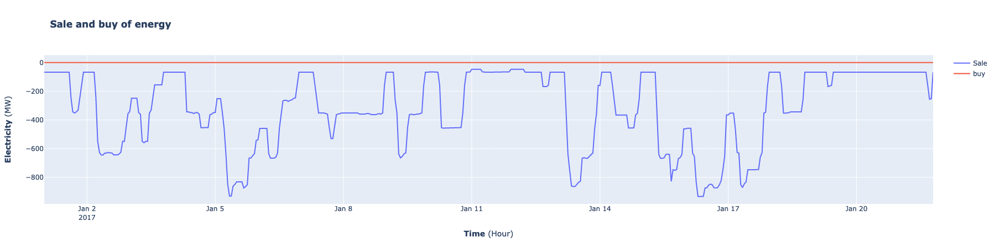

In [10]:
# Plot final result: market sale and buy
sale=shop.model.market["1"].sale.get()
buy=shop.model.market["1"].buy.get()
fig = go.Figure()  
fig.add_trace(go.Scatter(x=sale.index, y=sale.values, name="Sale"))
fig.add_trace(go.Scatter(x=buy.index, y=buy.values, name="buy"))
fig.update_layout(title="<b>Sale and buy of energy </b>", xaxis_title="<b>Time</b> (Hour)", yaxis_title="<b>Electricity</b> (MW)")
fig.show()

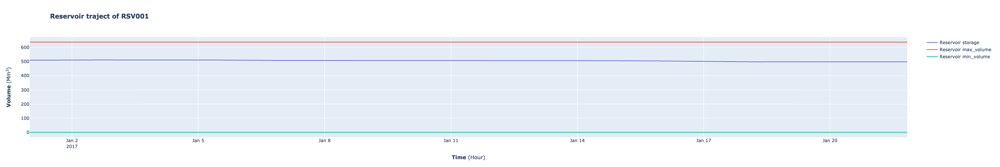

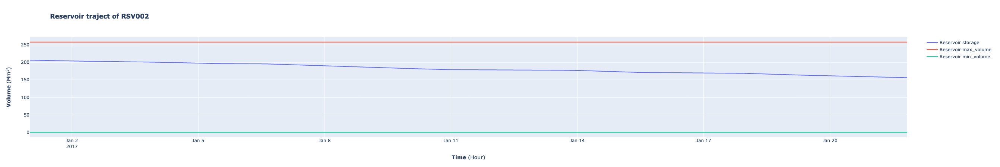

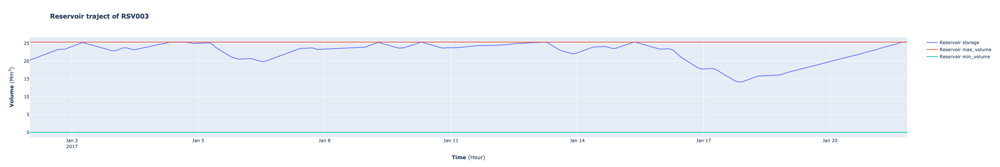

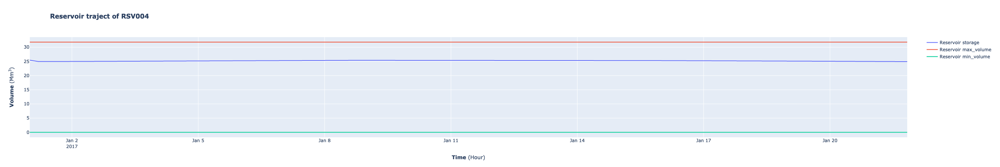

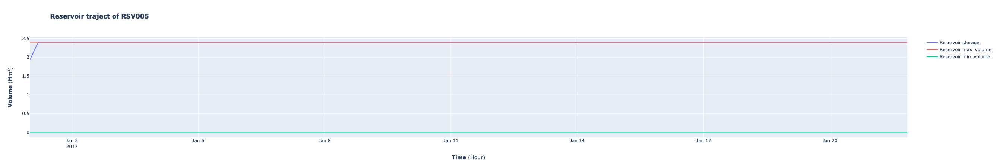

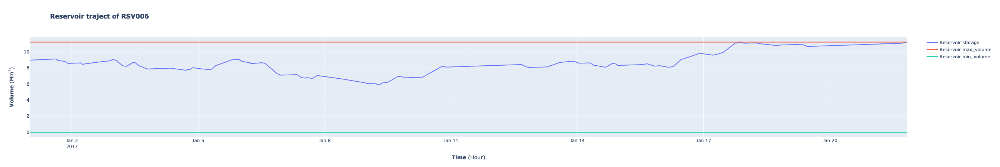

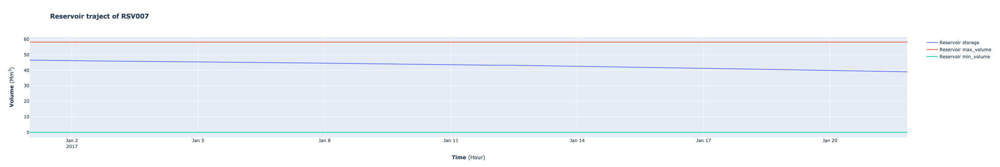

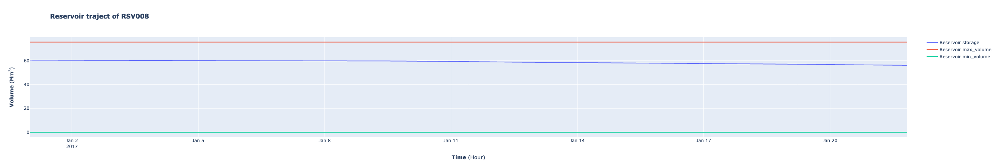

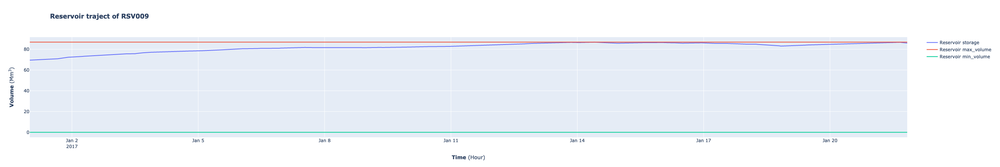

In [18]:
# Plot final result: reservoir traject 
for rsv in shop.model.reservoir: 
    water_storage=rsv.storage.get()
    
    max_vol=rsv.max_vol.get()
    txy_max_vol=pd.Series(dtype=object,index=water_storage.index)
    txy_max_vol=txy_max_vol.fillna(max_vol)
    
    min_level=rsv.lrl.get()
    vol_water_level=rsv.vol_head.get()
    interplation_function = interp1d(vol_water_level.values, vol_water_level.index)
    min_vol=float(interplation_function(min_level))
    txy_min_vol=pd.Series(dtype=object,index=water_storage.index)
    txy_min_vol=txy_min_vol.fillna(min_vol)
    
    fig = go.Figure()  
    title_name="<b>Reservoir traject of "+rsv.get_name()+"</b>"
    fig.add_trace(go.Scatter(x=water_storage.index, y=water_storage.values, name="Reservoir storage"))
    fig.add_trace(go.Scatter(x=txy_max_vol.index, y=txy_max_vol.values, name="Reservoir max_volume")) 
    fig.add_trace(go.Scatter(x=txy_min_vol.index, y=txy_min_vol.values, name="Reservoir min_volume"))   
    fig.update_layout(title=title_name, xaxis_title="<b>Time</b> (Hour)", yaxis_title="<b>Volume</b> (Mm<sup>3</sup>)")
    fig.show()

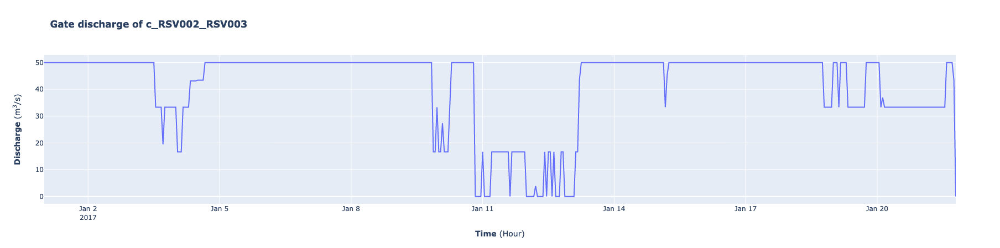

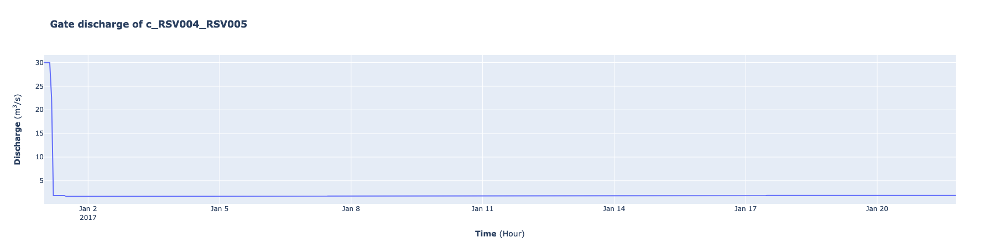

In [12]:
# Plot final result: gate discharge
for gate in shop.model.gate: 
    gate_discharge=gate.discharge.get()
    
    plot = "false"
    for t in range(len(gate_discharge.index)):
        if (gate_discharge.values[t] > 0.001):
            plot = "true"
            break
      
    if (plot == "true"):
        fig = go.Figure()  
        title_name="<b>Gate discharge of "+gate.get_name()+"</b>"
        fig.add_trace(go.Scatter(x=gate_discharge.index, y=gate_discharge.values, name="Gate discharge"))
        fig.update_layout(title=title_name, xaxis_title="<b>Time</b> (Hour)", yaxis_title="<b>Discharge</b> (m<sup>3</sup>/s)")
        fig.show()

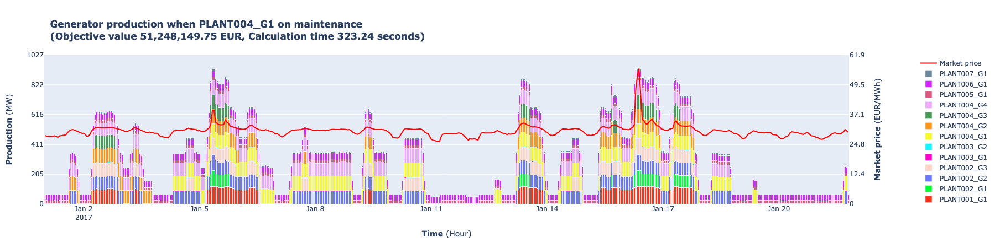

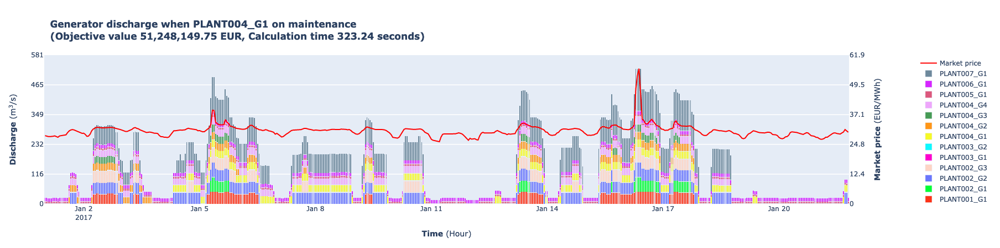

In [13]:
# Plot final result: generator production 
fig = make_subplots(specs=[[{"secondary_y": True}]])
max_production = 0
for gen in shop.model.generator: 
    gen_production=gen.production.get()  
    curve_name=gen.get_name()
    fig.add_trace(go.Bar(x=gen_production.index, y=gen_production.values, name=curve_name), secondary_y=False)    
    max_production = max_production + np.max(gen_production)
spot_price=shop.model.market["1"].sale_price.get()
fig.add_trace(go.Scatter(x=spot_price.index, y=spot_price.values, name="Market price", marker_color="red"), secondary_y=True)
fig.update_layout(title_text="<b>Generator production "+ title +"<br>(Objective value "+str(objective_value)+" EUR, Calculation time "+str(calculation_time)+" seconds) </b>", barmode="stack", colorway=px.colors.qualitative.Light24)
fig.update_xaxes(title_text="<b>Time</b> (Hour)")
max_production = 1.1 * max_production
fig.update_yaxes(title_text="<b>Production</b> (MW)", secondary_y=False, range=[0, max_production], tick0=max_production/5, dtick=max_production/5)
max_price = 1.1 * np.max(spot_price)
fig.update_yaxes(title_text="<b>Market price</b> (EUR/MWh)", secondary_y=True, range=[0, max_price], tick0=max_price/5, dtick=max_price/5)
fig.show()


# Plot final result: generator discharge 
fig = make_subplots(specs=[[{"secondary_y": True}]])
max_discharge = 0
for gen in shop.model.generator: 
    gen_discharge=gen.discharge.get()    
    curve_name=gen.get_name()
    fig.add_trace(go.Bar(x=gen_discharge.index, y=gen_discharge.values, name=curve_name), secondary_y=False)    
    max_discharge = max_discharge + np.max(gen_discharge)
spot_price=shop.model.market["1"].sale_price.get()
fig.add_trace(go.Scatter(x=spot_price.index, y=spot_price.values, name="Market price", marker_color="red"), secondary_y=True)
fig.update_layout(title_text="<b>Generator discharge "+ title +"<br>(Objective value "+str(objective_value)+" EUR, Calculation time "+str(calculation_time)+" seconds) </b>", barmode="stack", colorway=px.colors.qualitative.Light24)
fig.update_xaxes(title_text="<b>Time</b> (Hour)")
max_discharge = 1.1 * max_discharge
fig.update_yaxes(title_text="<b>Discharge</b> (m<sup>3</sup>/s)", secondary_y=False, range=[0, max_discharge], tick0=max_discharge/5, dtick=max_discharge/5)
max_price = 1.1 * np.max(spot_price)
fig.update_yaxes(title_text="<b>Market price</b> (EUR/MWh)", secondary_y=True, range=[0, max_price], tick0=max_price/5, dtick=max_price/5)
fig.show()

### Run the optimization model with the change of plant maintenance plan <a id="Loop"></a>

In [19]:
# Run SHOP in a loop with the change of plant maintenance plan
plant_maintenance_list=[]
objective_value_list=[]
calculation_time_list=[]

plant_maintenance_list.append("No maintenance")

shop = ShopSession(license_path="", silent=False, log_file="log.file")
build_model(shop)

start_time=time.time()
run_model(shop)
seconds_used=time.time()-start_time
calculation_time_list.append(seconds_used)

objective_value=-shop.model.objective["average_objective"].grand_total.get()
objective_value_list.append(objective_value)

for plant in shop.model.plant:
    
    plant_text=f"{plant.get_name()}"
    plant_maintenance_list.append(plant_text)

    shop_in_a_loop = ShopSession(license_path="", silent=False, log_file="log.file")
    build_model(shop_in_a_loop)
    
    # Use generator maintenance_flag
    for generator in shop_in_a_loop.model.plant[plant_text].generators:
        generator.maintenance_flag.set(pd.Series([1],[starttime])) 
    
    # Use plant maintenance_flag
    #shop_in_a_loop.model.plant[plant_text].maintenance_flag.set(pd.Series([1],[starttime])) 
    
    start_time=time.time()
    run_model(shop_in_a_loop)
    seconds_used=time.time()-start_time
    calculation_time_list.append(seconds_used)
    
    objective_value=-shop_in_a_loop.model.objective["average_objective"].grand_total.get() 
    objective_value_list.append(objective_value)


ValueError: Unknown object: "RSV002" of type: "generator"

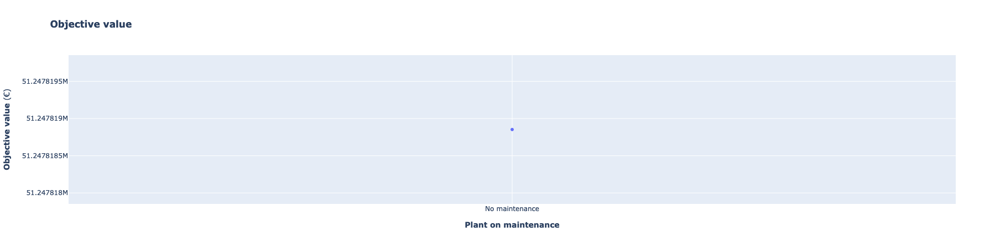

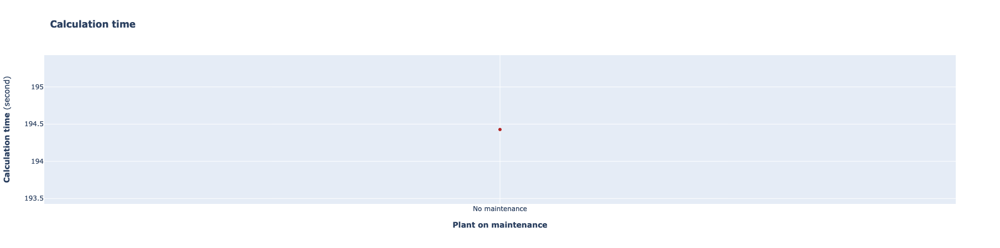

In [15]:
# Plot objective value 
fig = go.Figure()

fig.add_trace(go.Scatter(x=plant_maintenance_list, y=objective_value_list))
fig.update_layout(title="<b>Objective value </b>", xaxis_title="<b>Plant on maintenance</b>", yaxis_title="<b>Objective value</b> (€)")

fig.show()

# Plot calculation time 

fig = go.Figure()

fig.add_trace(go.Scatter(x=plant_maintenance_list, y=calculation_time_list, name="Calculation time", line=dict(color='firebrick', width=4)))
fig.update_layout(title="<b>Calculation time </b>", xaxis_title="<b>Plant on maintenance</b>", yaxis_title="<b>Calculation time</b> (second)")

fig.show()